# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

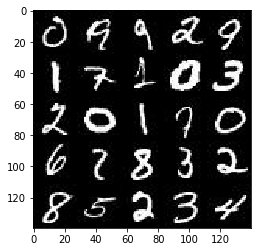

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

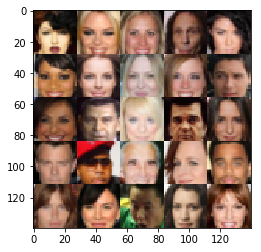

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input_image = tf.placeholder(
        tf.float32, [None, image_width, image_height, image_channels])
    z_input_image = tf.placeholder(tf.float32, [None, z_dim])
    learning_rate = tf.placeholder(tf.float32)    
    return real_input_image, z_input_image, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/home/carnd/anaconda3/envs/dl/lib/python3.5/runpy.py", line 184, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/home/carnd/anaconda3/envs/dl/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/home/carnd/anaconda3/envs/dl/lib/python3.5/site-packages/ipykernel/__main__.py", line 3, in <module>\n    app.launch_new_instance()', 'File "/home/carnd/anaconda3/envs/dl/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/home/carnd/anaconda3/envs/dl/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 474, in start\n    ioloop.IOLoop.instance().start()', 'File "/home/carnd/anaconda3/envs/dl/

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=None):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    def conv2d(x, filters):        
        return tf.layers.conv2d(x, filters, kernel_size=5, strides=2, padding='same',
                                # NOTE: CHANGE SUGGESTED BY REVIEWER.    
                                kernel_initializer=tf.contrib.layers.xavier_initializer())
    
    def leakyLeRU(x):
        return tf.maximum(alpha * x, x)        

    with tf.variable_scope('discriminator', reuse=reuse):    
        # NOTE: CHANGE SUGGESTED BY REVIEWER.             
        #
        # See also https://medium.com/towards-data-science/gan-by-example-using-keras-on-tensorflow-backend-1a6d515a60d0
        
        x = conv2d(images, 64)
        x = leakyLeRU(x)
        if keep_prob != None:
            x = tf.nn.dropout(x, keep_prob)   
            
        x = conv2d(images, 128)
        x = tf.layers.batch_normalization(x, training=True)
        x = leakyLeRU(x)
        if keep_prob != None:
            x = tf.nn.dropout(x, keep_prob)   
            
        x = conv2d(images, 256)
        x = tf.layers.batch_normalization(x, training=True)
        x = leakyLeRU(x)        
        if keep_prob != None:
            x = tf.nn.dropout(x, keep_prob)   
            
        x = conv2d(images, 512)
        x = tf.layers.batch_normalization(x, training=True)
        x = leakyLeRU(x)         
        if keep_prob != None:
            x = tf.nn.dropout(x, keep_prob)           

        #x = conv2d(images, 1024)
        #x = tf.layers.batch_normalization(x, training=True)
        #x = leakyLeRU(x)       
        #if keep_prob != None:
        #    x = tf.nn.dropout(x, keep_prob)   
                        
        flat = tf.reshape(x, (-1, 4*4*512))        
        logits = tf.layers.dense(flat, 1)        

        out = tf.sigmoid(logits)
            
    return logits, out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=None):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    def conv2d_transpose(x, filters, strides=2):
        return tf.layers.conv2d_transpose(x, filters, kernel_size=5, strides=strides, padding='same')
        
    def leakyLeRU(x):
        return tf.maximum(alpha * x, x)      
    
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        
        """
        # NOTE: CHANGE SUGGESTED BY REVIEWER (make the network bigger).
        x = tf.layers.dense(z, 2 * 2 * 512)

        # NOTE: CHANGE SUGGESTED BY REVIEWER.        
        if keep_prob != None:
             x = tf.nn.dropout(x, keep_prob)                    
        
        x = tf.reshape(x, (-1, 2, 2, 512))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)        
        
        tf.image.resize_images(x, [4,4])
        
        x = conv2d_transpose(x, 256)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)          
        # 8 x 8 x 512
        
        x = tf.image.resize_images(x, [7,7])
        
        x = conv2d_transpose(x, 128)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)     
        # 14 x 14 x 256

        x = conv2d_transpose(x, 128)                   
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)          
        # 28 x 28 x 128          
    
        logits = tf.layers.conv2d_transpose(
               x, out_channel_dim, kernel_size=5, strides=2, padding='same')                        
        # 28 x 28 x out_channel_dim
        
        out = tf.tanh(logits)         
        """

        # Should this be 256??
        x = tf.layers.dense(z, 7 * 7 * 256)

        # NOTE: CHANGE SUGGESTED BY REVIEWER.        
        if keep_prob != None:
             x = tf.nn.dropout(x, keep_prob)  
                
                
        x = tf.reshape(x, (-1, 7, 7, 256))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)        
                
        x = conv2d_transpose(x, 64)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)     
        # 14 x 14 x 256

        x = conv2d_transpose(x, 32)                   
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)          

        x = tf.layers.conv2d_transpose(x, 32, 1)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leakyLeRU(x)          
                    
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, 1)
        # 28 x 28 x out_channel_dim
                
        out = tf.tanh(logits)                
                
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, g_keep_prob=None, d_keep_prob=None):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(
        input_z, out_channel_dim, alpha=alpha, keep_prob=g_keep_prob)
    d_model_real, d_logits_real = discriminator(
        input_real, reuse=False, alpha=alpha, keep_prob=d_keep_prob)
    d_model_fake, d_logits_fake = discriminator(
        g_model, reuse=True, alpha=alpha, keep_prob=d_keep_prob)
    
    # Discriminator real loss. Labels are 1 since the discriminator attempts to detect
    # real images.
    # One-sided label smoothing (https://github.com/soumith/ganhacks#6-use-soft-and-noisy-labels)
    #
    # NOTE: CHANGE SUGGESTED BY REVIEWER.                    
    labels = tf.ones_like(d_model_real) * 0.9
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real, labels=labels))
    
    # Discriminator fake loss. Labels are 0 since the discriminator attempts to detect
    # fake images.
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    # Generator loss. Labels are 1 since the generator attempts to fake
    # the discriminator.
    #
    # NOTE: CHANGE SUGGESTED BY REVIEWER.
    labels = tf.ones_like(d_model_fake) * 0.9  #here too?
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=labels))

    return d_loss, g_loss    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(
            d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(
            g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode, g_keep_prob, d_keep_prob):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z, g_keep_prob: 1.0, d_keep_prob: 1.0})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode,
         g_keep_prob, d_keep_prob):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]    
    real_input_image, z_input_image, learning_rate_pf = model_inputs(
        image_width, image_height, image_channels, z_dim)

    g_keep_prob_pf = tf.placeholder(tf.float32)
    d_keep_prob_pf = tf.placeholder(tf.float32)
        
    d_loss, g_loss = model_loss(
        real_input_image, z_input_image, image_channels, alpha=0.2,
        g_keep_prob=g_keep_prob_pf, d_keep_prob=d_keep_prob_pf)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate_pf, beta1)    
    
    losses = []
    steps = 0
    print_every = 10
    show_every = 50
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for orig_batch_images in get_batches(batch_size):
                steps += 1
                
                # Convert the scale of input images [-0.5, 0.5] to [-1, 1]
                #
                # NOTE: BUG FIX
                batch_images = orig_batch_images * 2.0
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Try normal distribution as discussed in 
                # https://github.com/soumith/ganhacks
                # batch_z = np.clip(np.random.normal(0, 0.1, size=(batch_size, z_dim)), -1.0, 1.0)
                            
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={
                        real_input_image: batch_images,
                        z_input_image:    batch_z,
                        learning_rate_pf: learning_rate,
                        g_keep_prob_pf:   g_keep_prob,
                        d_keep_prob_pf:   d_keep_prob})
                
                # Run g_opt twice to make sure that d_loss does not go to zero
                # http://bamos.github.io/2016/08/09/deep-completion/                
                #
                # NOTE: CHANGE SUGGESTED BY REVIEWER.
                for i in range(2):
                    _ = sess.run(g_opt, feed_dict={
                            real_input_image: batch_images, 
                            z_input_image: batch_z,
                            learning_rate_pf: learning_rate,
                            g_keep_prob_pf: g_keep_prob,
                            d_keep_prob_pf: d_keep_prob})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({
                        real_input_image: batch_images, 
                        z_input_image: batch_z, 
                        g_keep_prob_pf: g_keep_prob,
                        d_keep_prob_pf: d_keep_prob})
                    train_loss_g = g_loss.eval({
                        real_input_image: batch_images, 
                        z_input_image: batch_z, 
                        g_keep_prob_pf: g_keep_prob,
                        d_keep_prob_pf: d_keep_prob})                        

                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:    
                    show_generator_output(sess, 64, z_input_image, image_channels, data_image_mode, g_keep_prob_pf, d_keep_prob_pf)
                    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.3283... Generator Loss: 0.6774
Epoch 1/2... Discriminator Loss: 1.3424... Generator Loss: 0.6824
Epoch 1/2... Discriminator Loss: 1.3839... Generator Loss: 0.6228
Epoch 1/2... Discriminator Loss: 1.4103... Generator Loss: 0.6471
Epoch 1/2... Discriminator Loss: 1.4746... Generator Loss: 0.5986


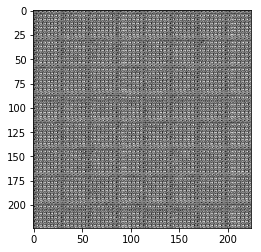

Epoch 1/2... Discriminator Loss: 1.4472... Generator Loss: 0.6096
Epoch 1/2... Discriminator Loss: 1.4217... Generator Loss: 0.6142
Epoch 1/2... Discriminator Loss: 1.4084... Generator Loss: 0.6063
Epoch 1/2... Discriminator Loss: 1.4185... Generator Loss: 0.6006
Epoch 1/2... Discriminator Loss: 1.4046... Generator Loss: 0.6017


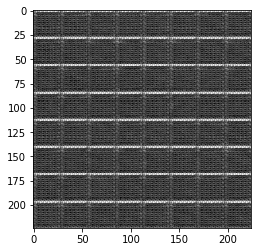

Epoch 1/2... Discriminator Loss: 1.3451... Generator Loss: 0.6183
Epoch 1/2... Discriminator Loss: 1.3113... Generator Loss: 0.6175
Epoch 1/2... Discriminator Loss: 1.3146... Generator Loss: 0.6275
Epoch 1/2... Discriminator Loss: 1.2858... Generator Loss: 0.6528
Epoch 1/2... Discriminator Loss: 1.2883... Generator Loss: 0.6471


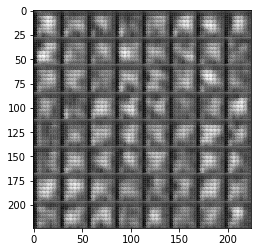

Epoch 1/2... Discriminator Loss: 1.3224... Generator Loss: 0.6460
Epoch 1/2... Discriminator Loss: 1.3301... Generator Loss: 0.6455
Epoch 1/2... Discriminator Loss: 1.3446... Generator Loss: 0.6512
Epoch 1/2... Discriminator Loss: 1.3567... Generator Loss: 0.6405
Epoch 1/2... Discriminator Loss: 1.3786... Generator Loss: 0.6352


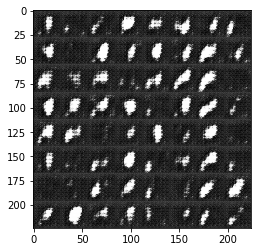

Epoch 1/2... Discriminator Loss: 1.3813... Generator Loss: 0.6447
Epoch 1/2... Discriminator Loss: 1.3763... Generator Loss: 0.6464
Epoch 1/2... Discriminator Loss: 1.3814... Generator Loss: 0.6481
Epoch 1/2... Discriminator Loss: 1.3811... Generator Loss: 0.6506
Epoch 1/2... Discriminator Loss: 1.3814... Generator Loss: 0.6596


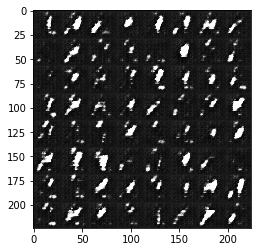

Epoch 1/2... Discriminator Loss: 1.3806... Generator Loss: 0.6594
Epoch 1/2... Discriminator Loss: 1.3783... Generator Loss: 0.6639
Epoch 1/2... Discriminator Loss: 1.3844... Generator Loss: 0.6597
Epoch 1/2... Discriminator Loss: 1.3808... Generator Loss: 0.6680
Epoch 1/2... Discriminator Loss: 1.3839... Generator Loss: 0.6702


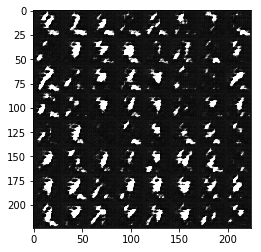

Epoch 1/2... Discriminator Loss: 1.3811... Generator Loss: 0.6709
Epoch 1/2... Discriminator Loss: 1.3787... Generator Loss: 0.6699
Epoch 1/2... Discriminator Loss: 1.3809... Generator Loss: 0.6724
Epoch 1/2... Discriminator Loss: 1.3883... Generator Loss: 0.6728
Epoch 1/2... Discriminator Loss: 1.3821... Generator Loss: 0.6735


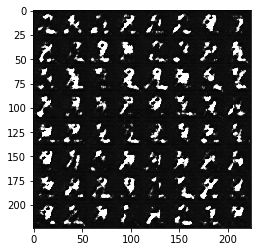

Epoch 1/2... Discriminator Loss: 1.3849... Generator Loss: 0.6748
Epoch 1/2... Discriminator Loss: 1.3890... Generator Loss: 0.6734
Epoch 1/2... Discriminator Loss: 1.3864... Generator Loss: 0.6773
Epoch 1/2... Discriminator Loss: 1.3845... Generator Loss: 0.6804
Epoch 1/2... Discriminator Loss: 1.3854... Generator Loss: 0.6784


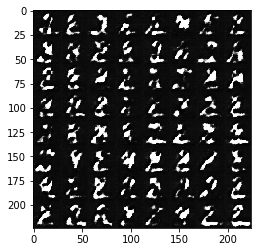

Epoch 1/2... Discriminator Loss: 1.3862... Generator Loss: 0.6756
Epoch 1/2... Discriminator Loss: 1.3856... Generator Loss: 0.6801
Epoch 1/2... Discriminator Loss: 1.3862... Generator Loss: 0.6786
Epoch 1/2... Discriminator Loss: 1.3828... Generator Loss: 0.6794
Epoch 1/2... Discriminator Loss: 1.3874... Generator Loss: 0.6765


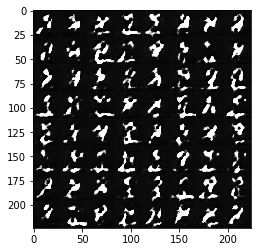

Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.6790
Epoch 1/2... Discriminator Loss: 1.3877... Generator Loss: 0.6793
Epoch 1/2... Discriminator Loss: 1.3847... Generator Loss: 0.6782
Epoch 1/2... Discriminator Loss: 1.3843... Generator Loss: 0.6804
Epoch 1/2... Discriminator Loss: 1.3902... Generator Loss: 0.6716


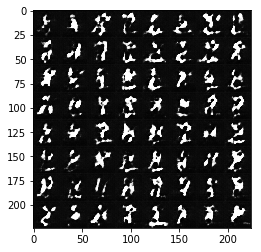

Epoch 1/2... Discriminator Loss: 1.3895... Generator Loss: 0.6791
Epoch 1/2... Discriminator Loss: 1.3877... Generator Loss: 0.6790
Epoch 1/2... Discriminator Loss: 1.3852... Generator Loss: 0.6806
Epoch 1/2... Discriminator Loss: 1.3894... Generator Loss: 0.6789
Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.6769


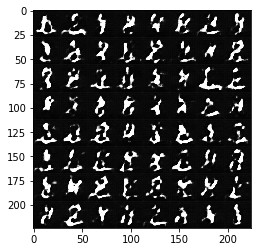

Epoch 1/2... Discriminator Loss: 1.3840... Generator Loss: 0.6816
Epoch 1/2... Discriminator Loss: 1.3877... Generator Loss: 0.6807
Epoch 1/2... Discriminator Loss: 1.3867... Generator Loss: 0.6775
Epoch 1/2... Discriminator Loss: 1.3843... Generator Loss: 0.6798
Epoch 1/2... Discriminator Loss: 1.3835... Generator Loss: 0.6794


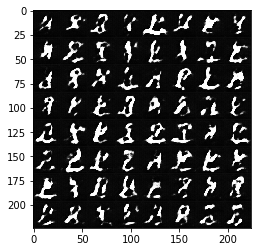

Epoch 1/2... Discriminator Loss: 1.3852... Generator Loss: 0.6832
Epoch 1/2... Discriminator Loss: 1.3832... Generator Loss: 0.6826
Epoch 1/2... Discriminator Loss: 1.3848... Generator Loss: 0.6818
Epoch 1/2... Discriminator Loss: 1.3850... Generator Loss: 0.6799
Epoch 1/2... Discriminator Loss: 1.3853... Generator Loss: 0.6815


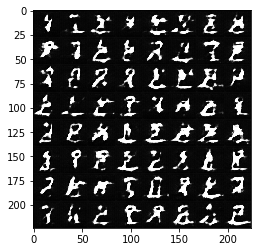

Epoch 1/2... Discriminator Loss: 1.3821... Generator Loss: 0.6830
Epoch 1/2... Discriminator Loss: 1.3849... Generator Loss: 0.6794
Epoch 1/2... Discriminator Loss: 1.3826... Generator Loss: 0.6838
Epoch 1/2... Discriminator Loss: 1.3858... Generator Loss: 0.6838
Epoch 1/2... Discriminator Loss: 1.3865... Generator Loss: 0.6818


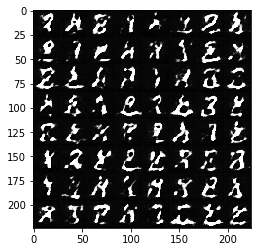

Epoch 1/2... Discriminator Loss: 1.3853... Generator Loss: 0.6842
Epoch 1/2... Discriminator Loss: 1.3852... Generator Loss: 0.6839
Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.6819
Epoch 1/2... Discriminator Loss: 1.3854... Generator Loss: 0.6855
Epoch 1/2... Discriminator Loss: 1.3850... Generator Loss: 0.6825


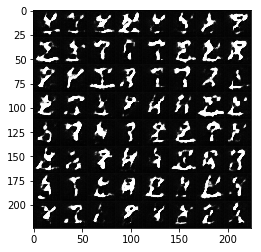

Epoch 1/2... Discriminator Loss: 1.3881... Generator Loss: 0.6843
Epoch 1/2... Discriminator Loss: 1.3862... Generator Loss: 0.6851
Epoch 1/2... Discriminator Loss: 1.3846... Generator Loss: 0.6835
Epoch 1/2... Discriminator Loss: 1.3854... Generator Loss: 0.6821
Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.6810


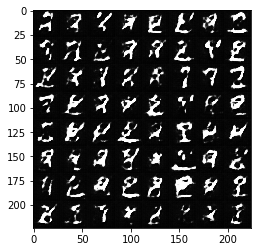

Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.6846
Epoch 1/2... Discriminator Loss: 1.3891... Generator Loss: 0.6838
Epoch 1/2... Discriminator Loss: 1.3841... Generator Loss: 0.6848
Epoch 1/2... Discriminator Loss: 1.3856... Generator Loss: 0.6872
Epoch 1/2... Discriminator Loss: 1.3864... Generator Loss: 0.6811


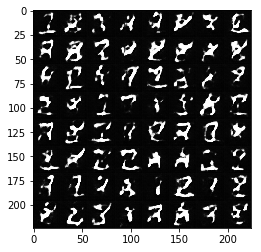

Epoch 1/2... Discriminator Loss: 1.3844... Generator Loss: 0.6847
Epoch 1/2... Discriminator Loss: 1.3832... Generator Loss: 0.6820
Epoch 1/2... Discriminator Loss: 1.3855... Generator Loss: 0.6829
Epoch 1/2... Discriminator Loss: 1.3855... Generator Loss: 0.6854
Epoch 1/2... Discriminator Loss: 1.3870... Generator Loss: 0.6825


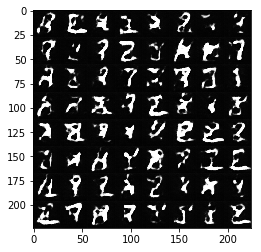

Epoch 1/2... Discriminator Loss: 1.3872... Generator Loss: 0.6849
Epoch 1/2... Discriminator Loss: 1.3882... Generator Loss: 0.6821
Epoch 1/2... Discriminator Loss: 1.3868... Generator Loss: 0.6855
Epoch 1/2... Discriminator Loss: 1.3854... Generator Loss: 0.6847
Epoch 1/2... Discriminator Loss: 1.3850... Generator Loss: 0.6848


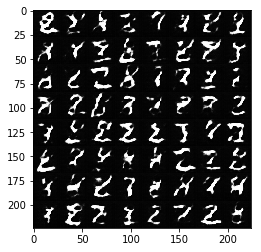

Epoch 1/2... Discriminator Loss: 1.3871... Generator Loss: 0.6854
Epoch 1/2... Discriminator Loss: 1.3882... Generator Loss: 0.6843
Epoch 1/2... Discriminator Loss: 1.3879... Generator Loss: 0.6831
Epoch 1/2... Discriminator Loss: 1.3869... Generator Loss: 0.6834
Epoch 1/2... Discriminator Loss: 1.3859... Generator Loss: 0.6868


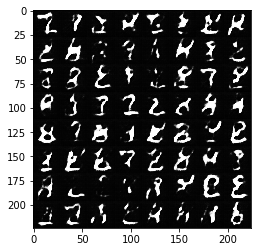

Epoch 1/2... Discriminator Loss: 1.3859... Generator Loss: 0.6840
Epoch 1/2... Discriminator Loss: 1.3872... Generator Loss: 0.6813
Epoch 1/2... Discriminator Loss: 1.3857... Generator Loss: 0.6847
Epoch 1/2... Discriminator Loss: 1.3855... Generator Loss: 0.6870
Epoch 1/2... Discriminator Loss: 1.3859... Generator Loss: 0.6866


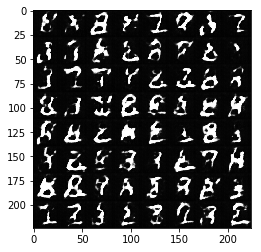

Epoch 1/2... Discriminator Loss: 1.3870... Generator Loss: 0.6848
Epoch 1/2... Discriminator Loss: 1.3869... Generator Loss: 0.6863
Epoch 1/2... Discriminator Loss: 1.3870... Generator Loss: 0.6841
Epoch 1/2... Discriminator Loss: 1.3862... Generator Loss: 0.6875
Epoch 1/2... Discriminator Loss: 1.3858... Generator Loss: 0.6872


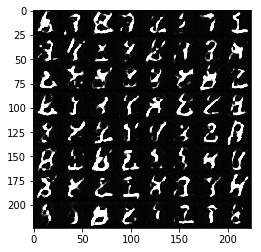

Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.6873
Epoch 1/2... Discriminator Loss: 1.3870... Generator Loss: 0.6850
Epoch 1/2... Discriminator Loss: 1.3865... Generator Loss: 0.6864
Epoch 1/2... Discriminator Loss: 1.3878... Generator Loss: 0.6865
Epoch 1/2... Discriminator Loss: 1.3885... Generator Loss: 0.6827


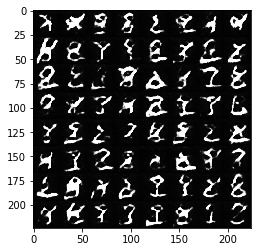

Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.6871
Epoch 1/2... Discriminator Loss: 1.3871... Generator Loss: 0.6855
Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.6862
Epoch 1/2... Discriminator Loss: 1.3845... Generator Loss: 0.6878
Epoch 1/2... Discriminator Loss: 1.3869... Generator Loss: 0.6881


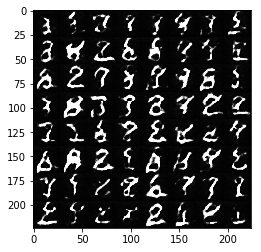

Epoch 1/2... Discriminator Loss: 1.3860... Generator Loss: 0.6853
Epoch 1/2... Discriminator Loss: 1.3872... Generator Loss: 0.6869
Epoch 1/2... Discriminator Loss: 1.3859... Generator Loss: 0.6885
Epoch 1/2... Discriminator Loss: 1.3858... Generator Loss: 0.6895
Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.6880


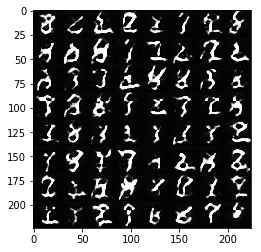

Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6872
Epoch 2/2... Discriminator Loss: 1.3878... Generator Loss: 0.6882
Epoch 2/2... Discriminator Loss: 1.3886... Generator Loss: 0.6839
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.6880
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.6880


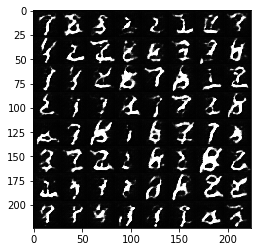

Epoch 2/2... Discriminator Loss: 1.3857... Generator Loss: 0.6883
Epoch 2/2... Discriminator Loss: 1.3861... Generator Loss: 0.6862
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6887
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.6884
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6886


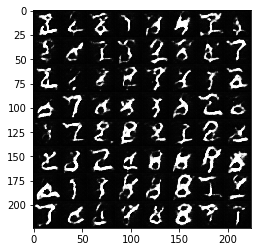

Epoch 2/2... Discriminator Loss: 1.3868... Generator Loss: 0.6899
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.6884
Epoch 2/2... Discriminator Loss: 1.3868... Generator Loss: 0.6864
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.6882
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6884


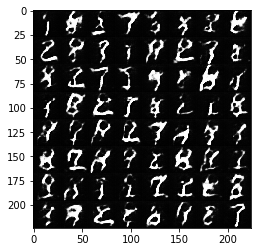

Epoch 2/2... Discriminator Loss: 1.3849... Generator Loss: 0.6856
Epoch 2/2... Discriminator Loss: 1.3868... Generator Loss: 0.6860
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.6878
Epoch 2/2... Discriminator Loss: 1.3858... Generator Loss: 0.6884
Epoch 2/2... Discriminator Loss: 1.3880... Generator Loss: 0.6858


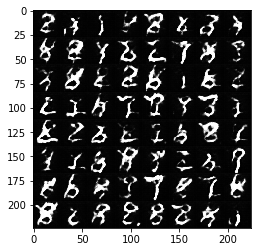

Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6886
Epoch 2/2... Discriminator Loss: 1.3868... Generator Loss: 0.6872
Epoch 2/2... Discriminator Loss: 1.3855... Generator Loss: 0.6898
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.6890
Epoch 2/2... Discriminator Loss: 1.3855... Generator Loss: 0.6883


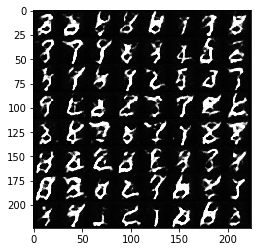

Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.6900
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.6899
Epoch 2/2... Discriminator Loss: 1.3876... Generator Loss: 0.6870
Epoch 2/2... Discriminator Loss: 1.3849... Generator Loss: 0.6892
Epoch 2/2... Discriminator Loss: 1.3869... Generator Loss: 0.6895


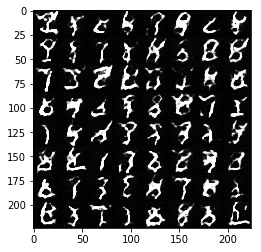

Epoch 2/2... Discriminator Loss: 1.3854... Generator Loss: 0.6886
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6895
Epoch 2/2... Discriminator Loss: 1.3877... Generator Loss: 0.6863
Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6899
Epoch 2/2... Discriminator Loss: 1.3874... Generator Loss: 0.6863


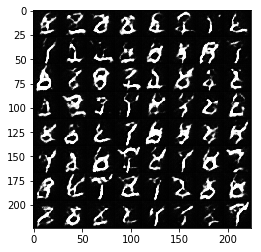

Epoch 2/2... Discriminator Loss: 1.3853... Generator Loss: 0.6880
Epoch 2/2... Discriminator Loss: 1.3857... Generator Loss: 0.6897
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6905
Epoch 2/2... Discriminator Loss: 1.3869... Generator Loss: 0.6879
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.6899


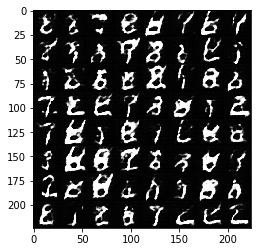

Epoch 2/2... Discriminator Loss: 1.3853... Generator Loss: 0.6896
Epoch 2/2... Discriminator Loss: 1.3893... Generator Loss: 0.6894
Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6894
Epoch 2/2... Discriminator Loss: 1.3865... Generator Loss: 0.6910
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6883


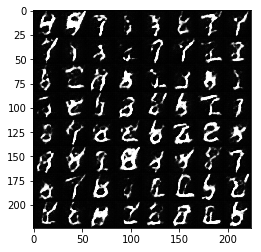

Epoch 2/2... Discriminator Loss: 1.3857... Generator Loss: 0.6892
Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 0.6897
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6888
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.6891
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.6900


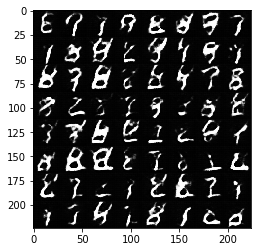

Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 0.6906
Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6907
Epoch 2/2... Discriminator Loss: 1.3861... Generator Loss: 0.6909
Epoch 2/2... Discriminator Loss: 1.3877... Generator Loss: 0.6901
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6902


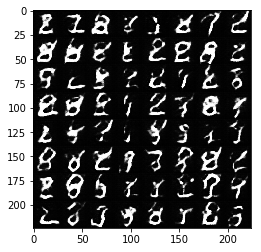

Epoch 2/2... Discriminator Loss: 1.3865... Generator Loss: 0.6897
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6908
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.6905
Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 0.6903
Epoch 2/2... Discriminator Loss: 1.3874... Generator Loss: 0.6893


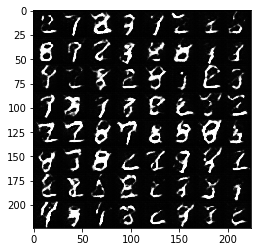

Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6901
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6907
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6915
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.6911
Epoch 2/2... Discriminator Loss: 1.3875... Generator Loss: 0.6894


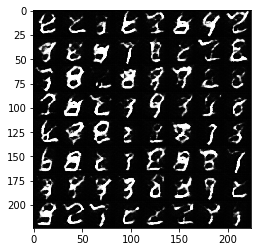

Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.6895
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.6901
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6904
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6908
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.6913


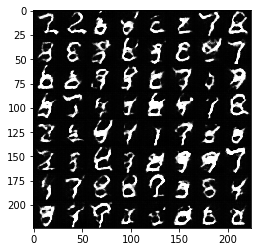

Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6910
Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 0.6900
Epoch 2/2... Discriminator Loss: 1.3865... Generator Loss: 0.6907
Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 0.6908
Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6917


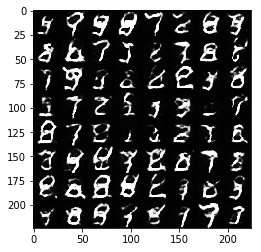

Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6917
Epoch 2/2... Discriminator Loss: 1.3871... Generator Loss: 0.6913
Epoch 2/2... Discriminator Loss: 1.3856... Generator Loss: 0.6917
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6915
Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.6918


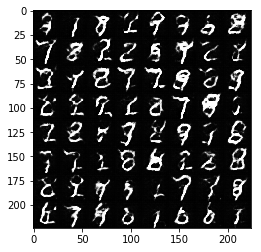

Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6923
Epoch 2/2... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6917
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.6912
Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 0.6919


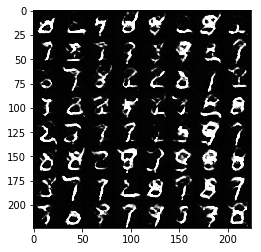

Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6920
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6918
Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 0.6917
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6918
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6917


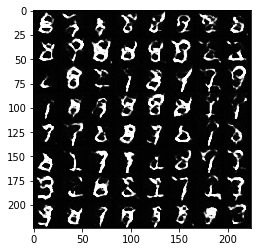

Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6920
Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6917
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6915
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6915
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.6920


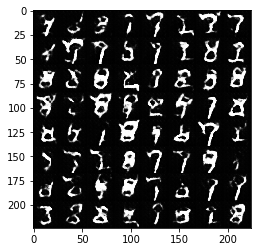

Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6919
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6903
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6918
Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.6921
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6917


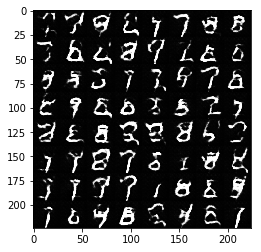

Epoch 2/2... Discriminator Loss: 1.3873... Generator Loss: 0.6907
Epoch 2/2... Discriminator Loss: 1.3861... Generator Loss: 0.6919
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6922
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6921
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6921


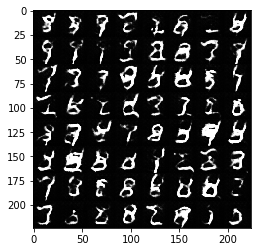

Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6915
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6920
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6924
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6923


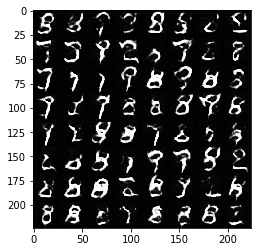

Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6915
Epoch 2/2... Discriminator Loss: 1.3861... Generator Loss: 0.6916
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6912
Epoch 2/2... Discriminator Loss: 1.3861... Generator Loss: 0.6924
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6922


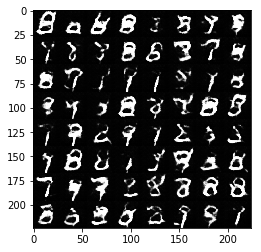

Epoch 2/2... Discriminator Loss: 1.3871... Generator Loss: 0.6920
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.6916
Epoch 2/2... Discriminator Loss: 1.3869... Generator Loss: 0.6916
Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 0.6916
Epoch 2/2... Discriminator Loss: 1.3874... Generator Loss: 0.6912


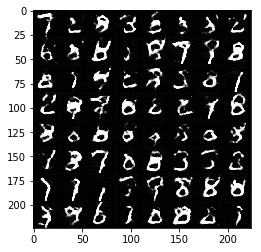

Epoch 2/2... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 0.6924
Epoch 2/2... Discriminator Loss: 1.3861... Generator Loss: 0.6924
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.6922


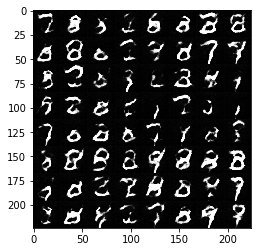

In [12]:
batch_size = 48
z_dim = 128
# The DCGAN with this architectural structure remains 
# stable with learning rate between 0.0001 and 0.0008.
learning_rate = 0.0003
beta1 = 0.5

g_keep_prob = 0.5
d_keep_prob = 0.7

tf.reset_default_graph()


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode, g_keep_prob, d_keep_prob)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.3226... Generator Loss: 0.6741
Epoch 1/1... Discriminator Loss: 1.3067... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.6569
Epoch 1/1... Discriminator Loss: 1.3510... Generator Loss: 0.6537


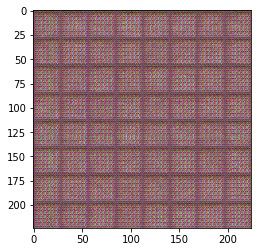

Epoch 1/1... Discriminator Loss: 1.3024... Generator Loss: 0.6813
Epoch 1/1... Discriminator Loss: 1.3426... Generator Loss: 0.6677
Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 0.6528
Epoch 1/1... Discriminator Loss: 1.3496... Generator Loss: 0.6688
Epoch 1/1... Discriminator Loss: 1.3727... Generator Loss: 0.6643


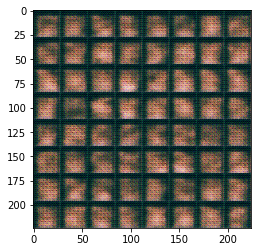

Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.6790
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.6657
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.6406
Epoch 1/1... Discriminator Loss: 1.4047... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.6498


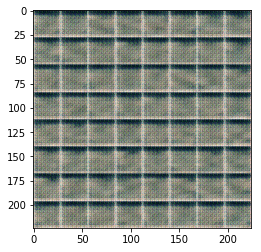

Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 0.6550
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.6599
Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 0.6564
Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.6452
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.6448


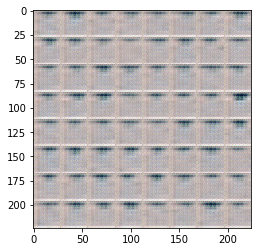

Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 0.6467
Epoch 1/1... Discriminator Loss: 1.3546... Generator Loss: 0.6488
Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.6508
Epoch 1/1... Discriminator Loss: 1.3396... Generator Loss: 0.6554
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.6556


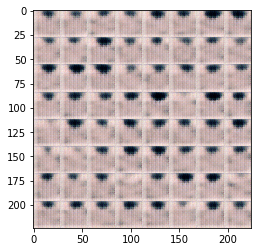

Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 1.3430... Generator Loss: 0.6587
Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.6686
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.6710


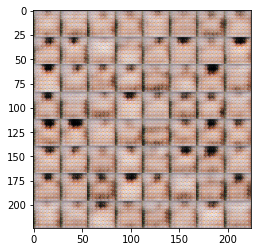

Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.6710
Epoch 1/1... Discriminator Loss: 1.3774... Generator Loss: 0.6728
Epoch 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.6679
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.6689


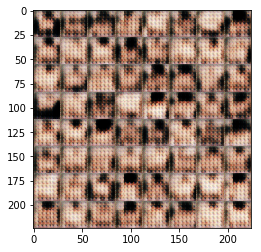

Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.6771
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.3763... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 1.3808... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.6721


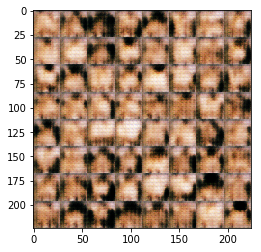

Epoch 1/1... Discriminator Loss: 1.4181... Generator Loss: 0.6577
Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.6842
Epoch 1/1... Discriminator Loss: 1.3802... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.6629


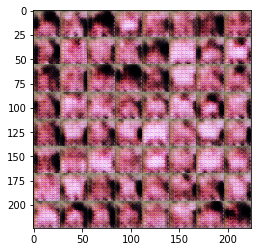

Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.6811
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 0.6754
Epoch 1/1... Discriminator Loss: 1.3845... Generator Loss: 0.6791
Epoch 1/1... Discriminator Loss: 1.3838... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.6810


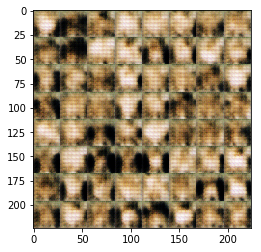

Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.6797
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.3845... Generator Loss: 0.6804
Epoch 1/1... Discriminator Loss: 1.3915... Generator Loss: 0.6783
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.6841


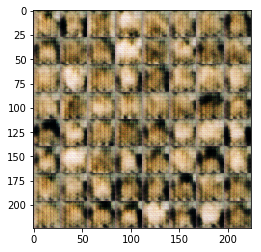

Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.6785
Epoch 1/1... Discriminator Loss: 1.3852... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6863
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6872


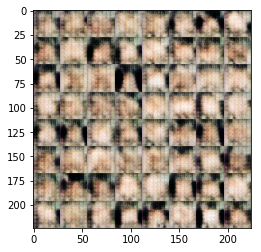

Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.6857
Epoch 1/1... Discriminator Loss: 1.3878... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.6867
Epoch 1/1... Discriminator Loss: 1.4203... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.6893


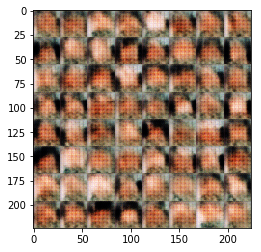

Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.6876
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.6889
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6901
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.6897
Epoch 1/1... Discriminator Loss: 1.3845... Generator Loss: 0.6891


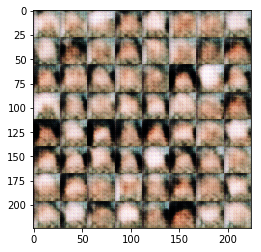

Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.6864
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6849
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6868
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.3878... Generator Loss: 0.6828


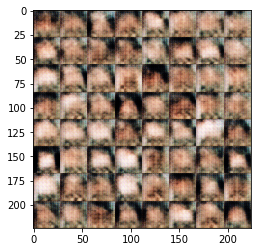

Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.6875
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6876
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6890


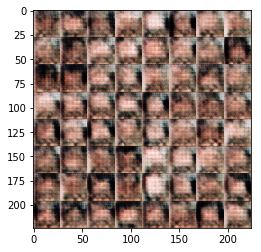

Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.6886
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.6898
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6854


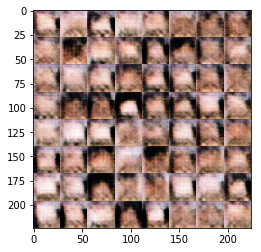

Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.6898
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.6901
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6891
Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.6890


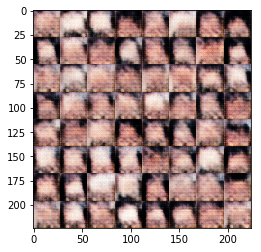

Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.6902
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6897
Epoch 1/1... Discriminator Loss: 1.3852... Generator Loss: 0.6890
Epoch 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.6888


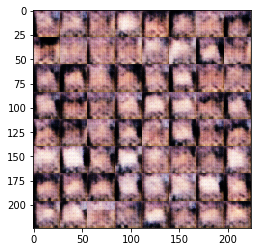

Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6886
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6898


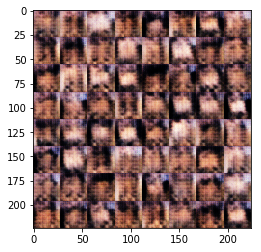

Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6906
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6908
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6911


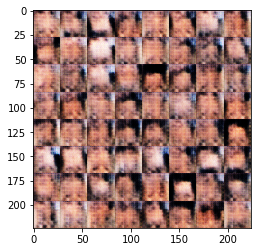

Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.6908
Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6893


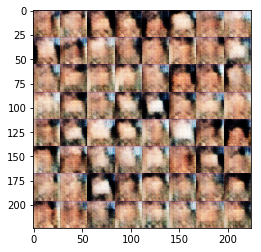

Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.6898
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.6902
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6909
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.6910
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.6912


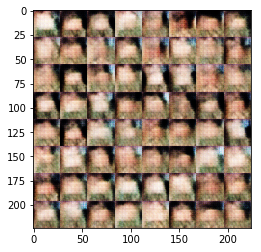

Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.6906
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6913
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6913
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6911


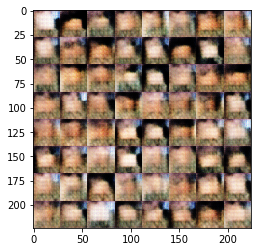

Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6909
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.3875... Generator Loss: 0.6900
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.6896


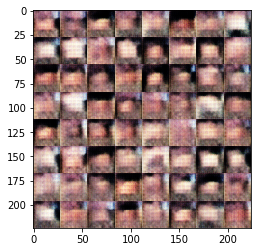

Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.6910
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6910
Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.6911


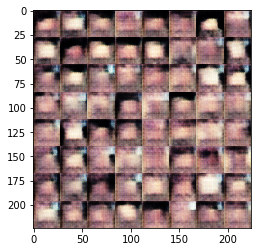

Epoch 1/1... Discriminator Loss: 1.3880... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6909


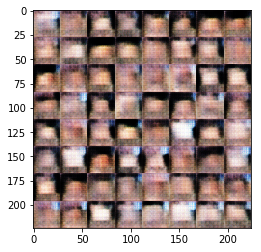

Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6909
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.6909
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.6909
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6915


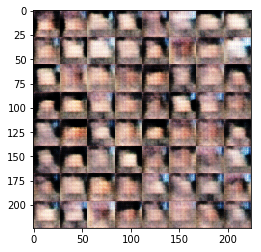

Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6922


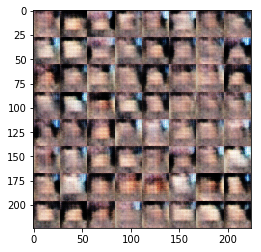

Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6918


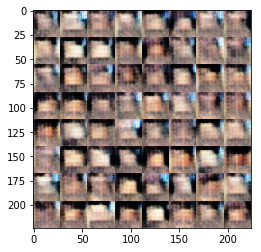

Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6925
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6923


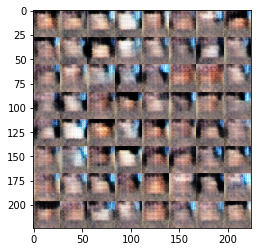

Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6917
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6917


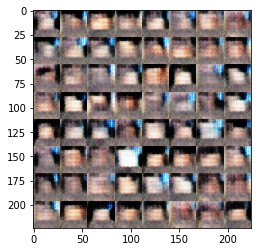

Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 0.6894
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6923


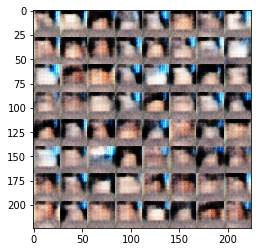

Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6925
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6917


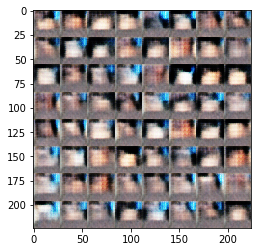

Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.6920


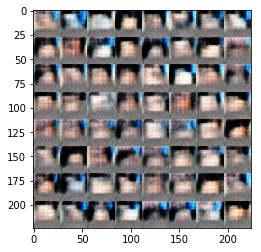

Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3873... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6921


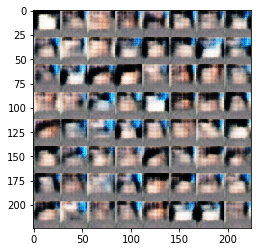

Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6925


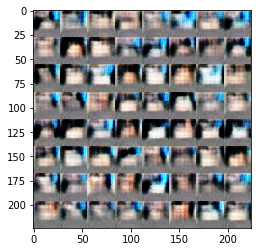

Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.6920


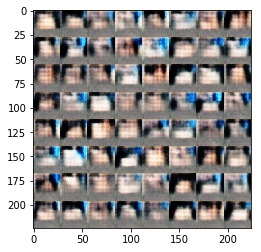

Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6925


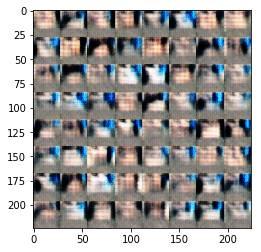

Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6927


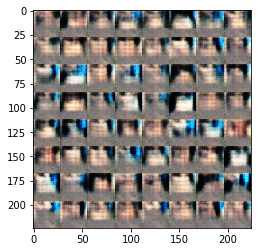

Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6924


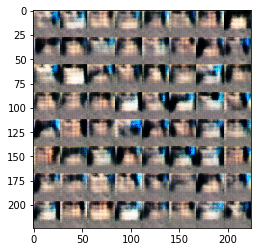

Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6930
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.6930
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6929
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6927


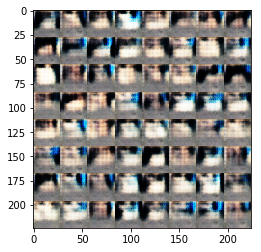

Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.6928


In [14]:
batch_size = 96
z_dim = 128
learning_rate = 0.0002
beta1 = 0.5

g_keep_prob = 0.5
d_keep_prob = 0.6

# --- The above was somewhat OK but went bad finally ----

batch_size = 96
z_dim = 128
learning_rate = 0.00015
beta1 = 0.5

g_keep_prob = 0.5
d_keep_prob = 0.6



tf.reset_default_graph()


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, g_keep_prob, d_keep_prob)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.